### YouTube data collection using YouTube Data API

In [59]:
import re
import os
import pandas as pd
from googleapiclient.discovery import build

# Function to extract video ID from the YouTube link
def get_video_id(youtube_url):
    regex = r'(?:https?://)?(?:www\.)?youtu\.?be(?:\.com)?/(?:watch\?v=|embed/|v/|.+/)?([a-zA-Z0-9-_]+)'
    match = re.match(regex, youtube_url)
    if match:
        return match.group(1)
    else:
        raise ValueError("Invalid YouTube URL")

# Function to extract comments and their date using pagination
def get_all_comments(video_id, api_key):
    # Building the YouTube API client
    youtube = build('youtube', 'v3', developerKey=api_key)

    # List to store all comments
    all_comments = []
    next_page_token = None

    # Fetch comments page by page
    while True:
        response = youtube.commentThreads().list(
            part='snippet',
            videoId=video_id,
            textFormat='plainText',
            maxResults=100,  # Maximum number of comments per page
            pageToken=next_page_token
        ).execute()

        # Extract comments and date
        for item in response['items']:
            comment = item['snippet']['topLevelComment']['snippet']['textDisplay']
            date = item['snippet']['topLevelComment']['snippet']['publishedAt']
            all_comments.append({'comment': comment, 'date': date})

        # Check if there is another page of comments
        next_page_token = response.get('nextPageToken')
        if not next_page_token:
            break

    return all_comments

# Main function to get user input and display comments in a DataFrame
def main():
    # Read the API key from the 'key.txt' file
    try:
        with open('key.txt', 'r') as file:
            api_key = file.read().strip()
    except FileNotFoundError:
        print("Error: 'key.txt' file not found.")
        return

    # Ask the user for the YouTube video link
    youtube_url = input("Enter YouTube video URL: ")

    try:
        # Extract video ID from the provided link
        video_id = get_video_id(youtube_url)
        
        # Fetch all comments and save them into a DataFrame
        comments = get_all_comments(video_id, api_key)
        df = pd.DataFrame(comments)
        
        # Display the DataFrame
        print(df)

        # Save the DataFrame to a CSV file
        df.to_csv('youtube_all_comments2.csv', index=False)
        print("All comments have been saved to 'youtube_all_comments.csv'.")

    except Exception as e:
        print(f"Error: {e}")

if __name__ == "__main__":
    main()


                                       comment                  date
0       Thank you for 300,000,000 Subscribers!  2024-07-13T16:00:05Z
1                                          SPD  2024-10-02T04:15:08Z
2                  U should do a 100 Youtubers  2024-10-02T03:03:42Z
3                    I love you Jaiden ❤❤❤❤❤❤❤  2024-10-02T02:53:43Z
4                       fede vigevani es mejor  2024-10-02T02:06:20Z
...                                        ...                   ...
334070                                   First  2024-07-13T16:00:10Z
334071                                    HYPE  2024-07-13T16:00:10Z
334072              BIGGEST VIDEO FOR SURE!! ❤  2024-07-13T16:00:10Z
334073                NIKO OMILANA FOR THE WIN  2024-07-13T16:00:09Z
334074  Thank you for 300,000,000 Subscribers!  2024-07-13T16:00:05Z

[334075 rows x 2 columns]
All comments have been saved to 'youtube_all_comments.csv'.


In [60]:
df = pd.read_csv('youtube_all_comments2.csv')
df.head()

,comment,date
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z
1,SPD,2024-10-02T04:15:08Z
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z
4,fede vigevani es mejor,2024-10-02T02:06:20Z


In [61]:
df.shape

(334075, 2)

### Basic Data preprocessing
##### Removing emoji
##### Removing duplicates

In [62]:
import re

def remove_emoji(text):
    
    if not isinstance(text, str):
        return ''

    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  # emoticons
                           u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                           u"\U0001F680-\U0001F6FF"  # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

df['translated_comment'] = df['comment'].apply(remove_emoji)


In [63]:
df.head()

,comment,date,translated_comment
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z,"Thank you for 300,000,000 Subscribers!"
1,SPD,2024-10-02T04:15:08Z,SPD
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z,U should do a 100 Youtubers
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z,I love you Jaiden
4,fede vigevani es mejor,2024-10-02T02:06:20Z,fede vigevani es mejor


In [64]:
df.drop_duplicates(subset=['translated_comment'], inplace=True)

# Remove NaN values
df.dropna(subset=['translated_comment'], inplace=True)

In [65]:
df.head()

,comment,date,translated_comment
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z,"Thank you for 300,000,000 Subscribers!"
1,SPD,2024-10-02T04:15:08Z,SPD
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z,U should do a 100 Youtubers
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z,I love you Jaiden
4,fede vigevani es mejor,2024-10-02T02:06:20Z,fede vigevani es mejor


In [66]:
df.shape

(255454, 3)

### Translating every comment to english using googletrans library

In [67]:
from googletrans import Translator, LANGUAGES

# Initialize the translator
translator = Translator()

def translate_to_english(text):
    # Check if the input is None or not a string (e.g., NaN or float)
    if text is None or not isinstance(text, str):
        return ''
    
    try:
        # Detect the language of the input text
        detection = translator.detect(text)
        
        # If the language is not English, translate it to English
        if detection.lang != 'en':
            translation = translator.translate(text, dest='en')
            return translation.text
        
        # If it's already in English, return the original text
        return text
    except Exception as e:
        print(f"Error in translation: {e}")
        return text  # Return the original text if there's an error

df['translated_comment'] = df['translated_comment'].apply(translate_to_english)
df


Error in translation: the JSON object must be str, bytes or bytearray, not NoneType
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: The read operation timed out
Error in translation: The read operation timed out
Error in translation: _ssl.c:980: The handshake operation timed out
Error in translation: sequence item 0: expected str instance, NoneType found
Error in translation: The read operation timed out
Error in translation: [Errno 11001] getaddrinfo failed
Error in translation: [Errno 11001] getaddrinfo failed
Error in translation: [Errno 11001] getaddrinfo failed
Error in translation: [Errno 11001] getaddrinfo failed
Error in tran

,comment,date,translated_comment
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z,"Thank you for 300,000,000 Subscribers!"
1,SPD,2024-10-02T04:15:08Z,SPD
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z,U should do a 100 Youtubers
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z,I love you Jaiden
4,fede vigevani es mejor,2024-10-02T02:06:20Z,Fede Vigevani is better
...,...,...,...
334050,The creativity of this man is insane,2024-07-13T16:00:13Z,The creativity of this man is insane
334052,IM TOO EARLY,2024-07-13T16:00:13Z,IM TOO EARLY
334062,Cirst,2024-07-13T16:00:12Z,Cirst
334072,BIGGEST VIDEO FOR SURE!! ❤,2024-07-13T16:00:10Z,BIGGEST VIDEO FOR SURE!!


### Handling Nan values, lowercasing, punctuation, html tags, stopwords

In [68]:
import numpy as np
df.replace('', np.nan, inplace=True)
df.dropna(inplace=True)

In [69]:
df['translated_comment'] = df['translated_comment'].str.lower()
df.head()

,comment,date,translated_comment
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z,"thank you for 300,000,000 subscribers!"
1,SPD,2024-10-02T04:15:08Z,spd
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z,u should do a 100 youtubers
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z,i love you jaiden
4,fede vigevani es mejor,2024-10-02T02:06:20Z,fede vigevani is better


In [70]:
from bs4 import BeautifulSoup
import re
import string

def preprocess(q):
    
    if not isinstance(q, str):
        return ''
        
    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()

    
    return q

In [71]:
df['translated_comment'] = df['translated_comment'].apply(preprocess)
df

c:\Users\Yash Mistry\AppData\Local\Programs\Python\Python310\lib\site-packages\bs4\__init__.py:435: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  warnings.warn(


,comment,date,translated_comment
0,"Thank you for 300,000,000 Subscribers!",2024-07-13T16:00:05Z,thank you for 300 000 000 subscribers
1,SPD,2024-10-02T04:15:08Z,spd
2,U should do a 100 Youtubers,2024-10-02T03:03:42Z,u should do a 100 youtubers
3,I love you Jaiden ❤❤❤❤❤❤❤,2024-10-02T02:53:43Z,i love you jaiden
4,fede vigevani es mejor,2024-10-02T02:06:20Z,fede vigevani is better
...,...,...,...
334050,The creativity of this man is insane,2024-07-13T16:00:13Z,the creativity of this man is insane
334052,IM TOO EARLY,2024-07-13T16:00:13Z,im too early
334062,Cirst,2024-07-13T16:00:12Z,cirst
334072,BIGGEST VIDEO FOR SURE!! ❤,2024-07-13T16:00:10Z,biggest video for sure


In [72]:
import nltk
nltk.download('stopwords')

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


False

In [73]:
import pandas as pd
import nltk
from nltk.corpus import stopwords


# Get English stopwords (you can change the language if needed)
stop_words = set(stopwords.words('english'))

def remove_stopwords(text):
    words = text.split()
    cleaned_words = [word for word in words if word.lower() not in stop_words]
    return ' '.join(cleaned_words)

df['translated_comment_stop_words'] = df['translated_comment'].apply(remove_stopwords)

### Sentiment analysis using TextBlob and VADER

In [74]:
from textblob import TextBlob

def get_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'Positive'
    elif analysis.sentiment.polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'

df['sentiment_textblob'] = df['translated_comment'].apply(get_sentiment)

In [75]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd

analyzer = SentimentIntensityAnalyzer()

def get_vader_sentiment(text):
    score = analyzer.polarity_scores(text)
    if score['compound'] >= 0.05:
        return 'Positive'
    elif score['compound'] <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'
    
df['sentiment_vader'] = df['translated_comment'].apply(get_vader_sentiment)

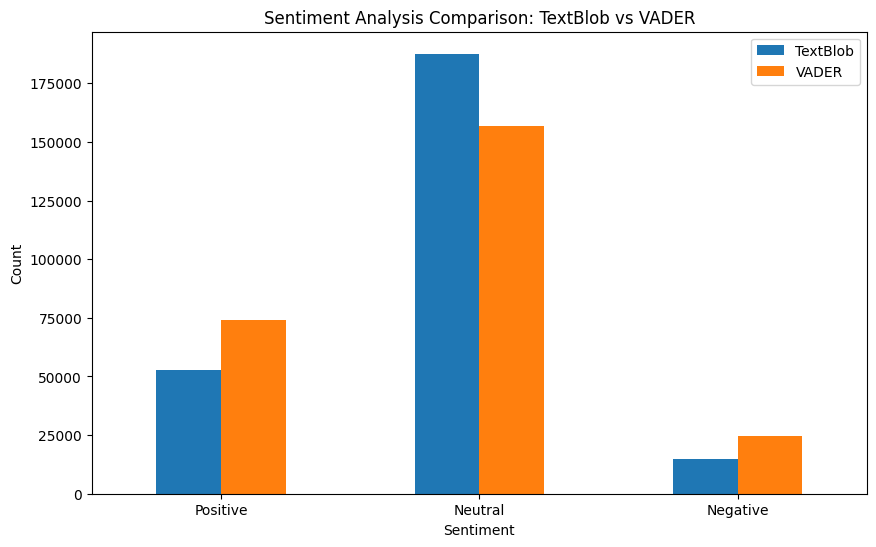

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

textblob_counts = df['sentiment_textblob'].value_counts()
vader_counts = df['sentiment_vader'].value_counts()

# Create a new DataFrame to store the counts for plotting
sentiment_comparison = pd.DataFrame({
    'Sentiment': ['Positive', 'Neutral', 'Negative'],
    'TextBlob': [textblob_counts.get('Positive', 0), textblob_counts.get('Neutral', 0), textblob_counts.get('Negative', 0)],
    'VADER': [vader_counts.get('Positive', 0), vader_counts.get('Neutral', 0), vader_counts.get('Negative', 0)]
})

# Plot the sentiment comparison using a bar plot
sentiment_comparison.set_index('Sentiment', inplace=True)

# Plot using seaborn
sentiment_comparison.plot(kind='bar', figsize=(10, 6))

plt.title('Sentiment Analysis Comparison: TextBlob vs VADER')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

### Most used word using wordcloud

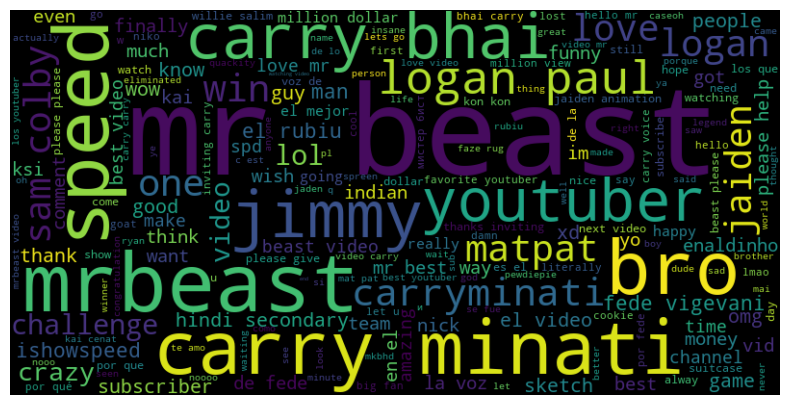

In [77]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud
wordcloud = WordCloud(width=800, height=400).generate(' '.join(df['translated_comment_stop_words']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### Topic Modeling (LDA) to cluster comments into different themes

In [78]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# Vectorize the text data
vectorizer = CountVectorizer(max_features=1000, stop_words='english')
X = vectorizer.fit_transform(df['translated_comment_stop_words'])

# Fit the LDA model
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X)

# Display topics
for index, topic in enumerate(lda.components_):
    print(f"Topic #{index}:")
    print([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[-10:]])


Topic #0:
['amixem', 'matpat', 'los', 'por', 'en', 'rubius', 'la', 'el', 'que', 'fede']
Topic #1:
['paul', '300', 'million', 'video', '000', 'money', 'help', 'logan', 'beast', 'mr']
Topic #2:
['win', 'video', 'voice', 'nick', 'hindi', '10', 'mrbeast', 'bhai', 'minati', 'carry']
Topic #3:
['win', 'game', 'colby', 'sam', 'sketch', 'video', 'speed', 'carryminati', 'jaiden', 'love']
Topic #4:
['speed', 'good', 'mrbeast', 'youtubers', 'enaldinho', 'youtuber', 'jimmy', 'best', 'bro', 'video']


In [79]:
lda.components_

array([[2.01180908e-01, 2.01136837e-01, 2.02334965e-01, ...,
        1.74195375e+02, 2.00318580e-01, 2.00286669e-01],
       [2.01412399e-01, 2.50419716e+03, 2.02538896e-01, ...,
        2.00451910e-01, 2.64198273e+02, 1.67196926e+02],
       [2.02777969e-01, 2.00460294e-01, 2.32083154e+02, ...,
        2.01980883e-01, 2.00543835e-01, 2.00736584e-01],
       [2.01583865e-01, 2.00394406e-01, 5.23094210e+01, ...,
        2.00078998e-01, 2.00070798e-01, 2.00029381e-01],
       [7.00193045e+02, 2.00848065e-01, 2.02550758e-01, ...,
        2.02113389e-01, 2.00793627e-01, 2.02021181e-01]])

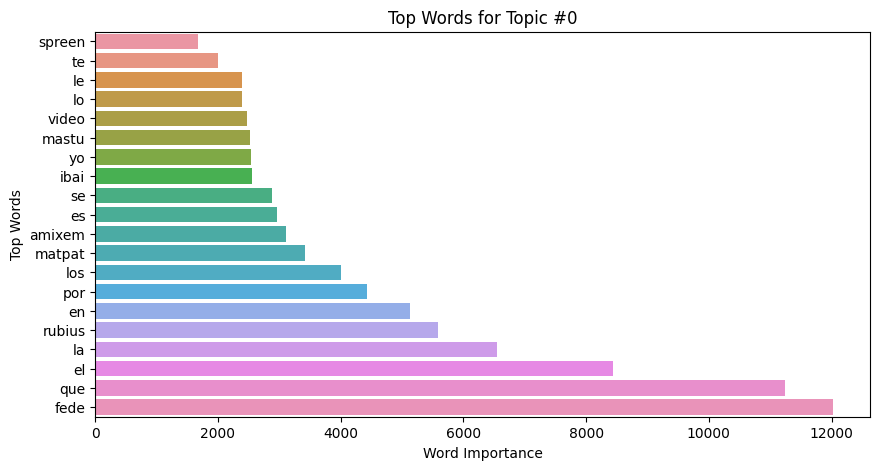

In [80]:
# Display top 20 words for each topic
topics = lda.components_

# Plot a bar chart of the top words in a specific topic
topic_idx = 0 
top_words = topics[topic_idx].argsort()[-20:]
words = [vectorizer.get_feature_names_out()[i] for i in top_words]
weights = topics[topic_idx][top_words]

# Plot
plt.figure(figsize=(10, 5))
sns.barplot(x=weights, y=words)
plt.xlabel('Word Importance')
plt.ylabel('Top Words')
plt.title(f'Top Words for Topic #{topic_idx}')
plt.show()


### Frequently Requested Content from Logs

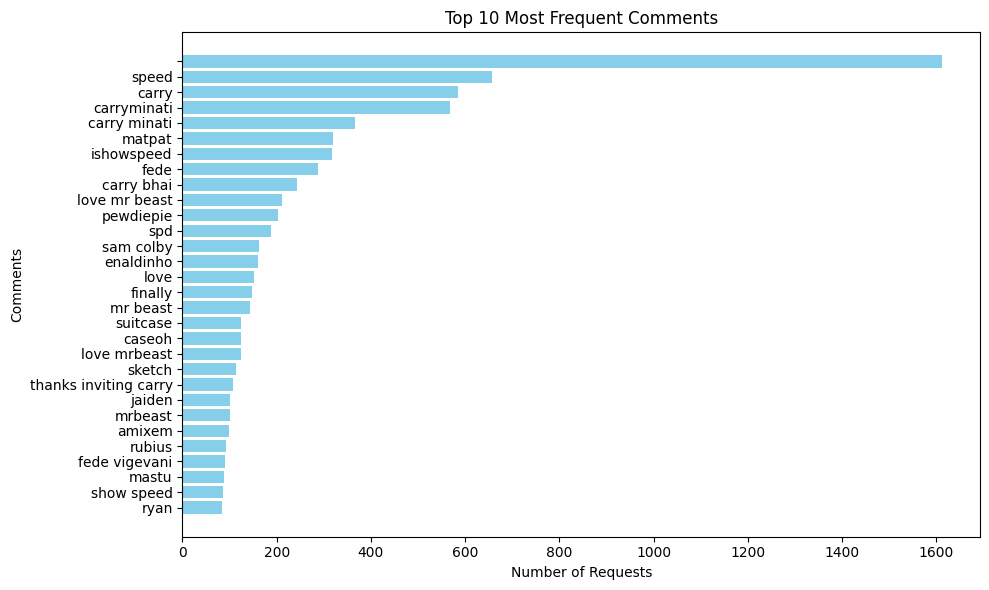

In [81]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter

# Assuming your DataFrame is named df and has a column 'translated_comment_stop_words'
comments = df['translated_comment_stop_words'].tolist()

# Count frequency of each comment
request_frequency = Counter(comments)

# Get the most frequent comments (you can limit to top N most frequent)
most_frequent_requests = request_frequency.most_common(30)  # Get top 10

# Separate the comments and their counts
comments, counts = zip(*most_frequent_requests)

# Create a DataFrame for visualization
df_requests = pd.DataFrame({
    'comment': comments,
    'count': counts
})

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.barh(df_requests['comment'], df_requests['count'], color='skyblue')
plt.xlabel('Number of Requests')
plt.ylabel('Comments')
plt.title('Top 10 Most Frequent Comments')
plt.gca().invert_yaxis()  # Invert y-axis to show the highest count at the top
plt.tight_layout()
plt.show()


### Pie Chart for Sentiment Distribution

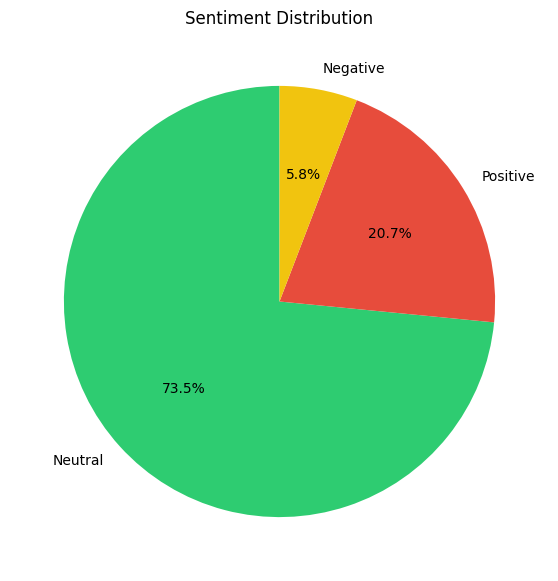

In [82]:
# Count the occurrences of each sentiment label
sentiment_counts = df['sentiment_textblob'].value_counts()

# Plot pie chart
plt.figure(figsize=(7, 7))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=90, colors=['#2ecc71', '#e74c3c', '#f1c40f'])
plt.title('Sentiment Distribution')
plt.show()

In [83]:
import pandas as pd

df['date'] = pd.to_datetime(df['date'])

def get_textblob_sentiment(text):
    return TextBlob(text).sentiment.polarity

# Apply the function to the comments
df['sentiment_score'] = df['translated_comment'].apply(get_textblob_sentiment)

### Sentiment Trend Over Time

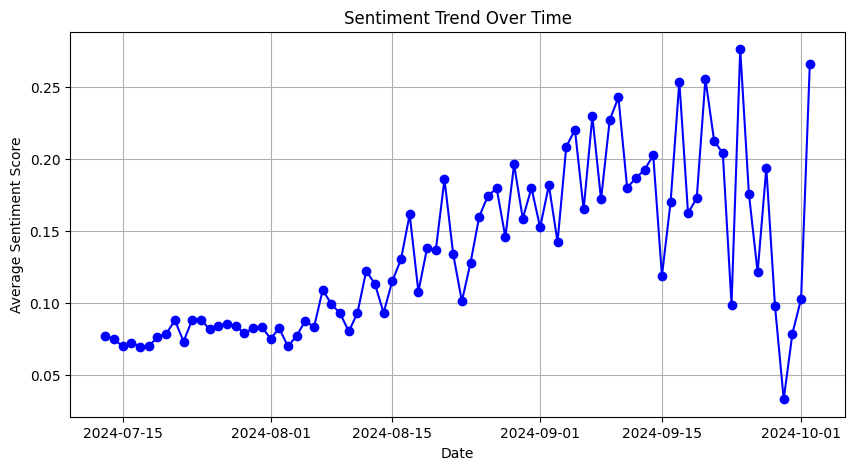

In [84]:
sentiment_trend = df.groupby(df['date'].dt.date)['sentiment_score'].mean()
plt.figure(figsize=(10, 5))
plt.plot(sentiment_trend.index, sentiment_trend.values, marker='o', linestyle='-', color='b')
plt.xlabel('Date')
plt.ylabel('Average Sentiment Score')
plt.title('Sentiment Trend Over Time')
plt.grid(True)
plt.show()

### Comment Volume Trend Over Time

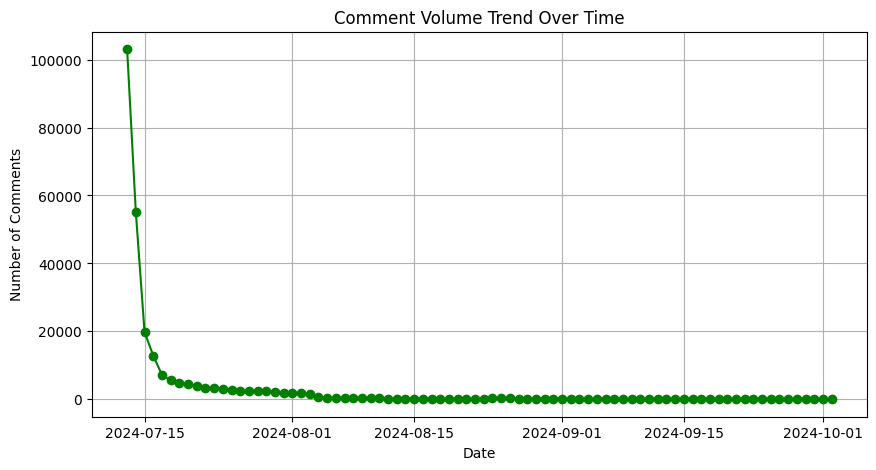

In [85]:
# Group by date and count number of comments per day
comment_volume = df.groupby(df['date'].dt.date)['translated_comment_stop_words'].count()

# Plot comment volume trend
plt.figure(figsize=(10, 5))
plt.plot(comment_volume.index, comment_volume.values, marker='o', linestyle='-', color='g')
plt.xlabel('Date')
plt.ylabel('Number of Comments')
plt.title('Comment Volume Trend Over Time')
plt.grid(True)
plt.show()


In [87]:
df.to_pickle('processed_comments.pkl')